# Prerequisites

In [ ]:
!pip install pycocotools

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
import torch
import albumentations as A
import torchvision.transforms as T
from tqdm import tqdm  # Import tqdm for progress bar
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
import json
import os
import numpy as np
import matplotlib.patches as patches  # Needed for visualization
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools import mask as maskUtils
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Load Data

In [ ]:
from datasets import load_dataset

dataset = load_dataset("EduardoPacheco/FoodSeg103")


In [ ]:
class FoodDataset(Dataset):
    def __init__(self, dataset, transforms=None):
        self.dataset = dataset
        self.transforms = transforms

    def __getitem__(self, idx):
        record = self.dataset[idx]
        
        # Load the image
        image = record['image']
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")

        
        # Load the mask (segmentation mask), convert to a NumPy array
        mask_image = record['label']
        if isinstance(mask_image, str):
            mask_image = Image.open(mask_image).convert('L') 
        mask_array = np.array(mask_image)

        # Prepare lists for bounding boxes, labels, and masks
        boxes = []
        labels = []
        masks = []
        
        # Iterate through the class IDs in `classes_on_image`
        for class_id in record['classes_on_image']:
            labels.append(int(class_id))

            # Create a binary mask for the current class ID
            binary_mask = (mask_array == class_id).astype(np.uint8)
            masks.append(torch.tensor(binary_mask, dtype=torch.uint8))

            # Compute the bounding box for the binary mask
            pos = np.where(binary_mask)

            if pos[0].size > 0 and pos[1].size > 0:
                x_min = np.min(pos[1])
                x_max = np.max(pos[1])
                y_min = np.min(pos[0])
                y_max = np.max(pos[0])
                
                # Filter out invalid bounding boxes (width or height == 0)
                if x_min < x_max and y_min < y_max:
                    boxes.append([x_min, y_min, x_max, y_max])
                else:
                    print(f"Skipping invalid box: [{x_min}, {y_min}, {x_max}, {y_max}]")
            else:
                print(f"No valid pixels found for class ID {class_id} in image {record['id']}")

        # Convert lists to tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        masks = torch.stack(masks) if masks else torch.empty((0, *image.size[::-1]), dtype=torch.uint8)

        # Create the target dictionary
        target = {
            'boxes': boxes,
            'labels': labels,
            'masks': masks,
            'image_id': torch.tensor([idx])
        }

        # Apply any image transformations (resize, normalize, etc.)
        if self.transforms:
            image = self.transforms(image)

        return image, target

    def __len__(self):
        return len(self.dataset)

# Define transformations (resizing, normalization) to apply to the images
transforms = T.Compose([
    T.ToTensor(),  # Converts PIL images to PyTorch tensors (C, H, W)
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_data = dataset['validation']

# Instantiate the dataset
val_dataset = FoodDataset(val_data, transforms=transforms)

# Evaluation

In [25]:
import torch
from torchvision.ops import nms

def apply_nms(pred_boxes, pred_scores, iou_threshold=0.5):
    """
    Applies Non-Maximum Suppression to eliminate duplicate predictions.
    
    Args:
        pred_boxes: Predicted bounding boxes (in [x_min, y_min, x_max, y_max] format).
        pred_scores: Confidence scores for each bounding box.
        iou_threshold: IoU threshold for suppression (default: 0.5).
    
    Returns:
        indices of boxes to keep after applying NMS.
    """
    # Convert boxes and scores to PyTorch tensors if they are not already
    pred_boxes = torch.tensor(pred_boxes)
    pred_scores = torch.tensor(pred_scores)

    # Apply NMS: returns the indices of boxes to keep
    keep_indices = nms(pred_boxes, pred_scores, iou_threshold)
    
    return keep_indices.numpy()  # Convert indices back to numpy if necessary


In [ ]:
# Define the class names
class_names = [
    "background", "candy", "egg tart", "french fries", "chocolate", "biscuit", "popcorn", 
    "pudding", "ice cream", "cheese butter", "cake", "wine", "milkshake", "coffee", "juice", 
    "milk", "tea", "almond", "red beans", "cashew", "dried cranberries", "soy", "walnut", 
    "peanut", "egg", "apple", "date", "apricot", "avocado", "banana", "strawberry", 
    "cherry", "blueberry", "raspberry", "mango", "olives", "peach", "lemon", "pear", "fig", 
    "pineapple", "grape", "kiwi", "melon", "orange", "watermelon", "steak", "pork", 
    "chicken duck", "sausage", "fried meat", "lamb", "sauce", "crab", "fish", "shellfish", 
    "shrimp", "soup", "bread", "corn", "hamburg", "pizza", "hanamaki baozi", "wonton dumplings", 
    "pasta", "noodles", "rice", "pie", "tofu", "eggplant", "potato", "garlic", "cauliflower", 
    "tomato", "kelp", "seaweed", "spring onion", "rape", "ginger", "okra", "lettuce", 
    "pumpkin", "cucumber", "white radish", "carrot", "asparagus", "bamboo shoots", 
    "broccoli", "celery stick", "cilantro mint", "snow peas", "cabbage", "bean sprouts", 
    "onion", "pepper", "green beans", "French beans", "king oyster mushroom", 
    "shiitake", "enoki mushroom", "oyster mushroom", "white button mushroom", "salad", 
    "other ingredients"
]


In [ ]:
def denormalize_image(image, mean, std):
    """
    De-normalizes the image based on the ImageNet mean and std used in training.
    """
    mean = np.array(mean).reshape(1, 1, 3)
    std = np.array(std).reshape(1, 1, 3)
    image = image * std + mean  # Reverse the normalization
    image = np.clip(image, 0, 1)  # Ensure the values are within [0, 1] range for display
    return image

In [ ]:
# Number of classes in your dataset (including background)
num_classes = 104  # Adjust this based on your dataset

# Load a pre-trained Mask R-CNN model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

# Replace the box predictor to match the number of classes
in_features_box = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features_box, num_classes)

# Replace the mask predictor to match the number of classes
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256  
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)

# Move the model to the device (GPU or CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Load the best model checkpoint
best_model_path = "/kaggle/input/mask-r-cnn-output/best_model.pth"
model.load_state_dict(torch.load(best_model_path))
model.eval()  # Set the model to evaluation mode

# DataLoader for the test set (ensure it's properly instantiated)
test_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Test/Validation Loop
test_loss = 0.0

# Initialize a list to store the evaluation results
evaluation_results = []

# Define a confidence threshold
confidence_threshold = 0.5

def encode_rle(mask):
    """
    Encodes a binary mask using Run-Length Encoding (RLE).
    Args:
        mask: A binary mask (2D numpy array of 0s and 1s).
    
    Returns:
        Encoded RLE mask.
    """
    mask = (mask > 0.5).astype(np.uint8)  # Convert to binary and uint8
    rle = maskUtils.encode(np.asfortranarray(mask))
    rle['counts'] = rle['counts'].decode('ascii')  # RLE encoding is byte encoded, decode for JSON serialization
    return rle

# Test/Validation Loop
with torch.no_grad():  # No gradient calculation during inference
    for idx, (images, targets) in enumerate(tqdm(test_loader, desc="Evaluating")):  # Add progress bar
        images = [image.to(device) for image in images]
        
        # Forward pass (inference mode returns predictions, not loss)
        outputs = model(images)

        # Process the outputs and save the predictions
        for i, output in enumerate(outputs):
            pred_boxes = output['boxes'].cpu().numpy()
            pred_scores = output['scores'].cpu().numpy()
            pred_labels = output['labels'].cpu().numpy()
            pred_masks = output['masks'].cpu().numpy()
            image_id = targets[i]['image_id'].cpu().item()
            
                # Instead of converting all masks at once, process each mask individually
            pred_masks_rle = []
            for mask in output['masks']:  # Iterate over each mask
                mask_np = mask.cpu().squeeze().numpy()  # Convert the mask to numpy one at a time
                mask_rle = encode_rle(mask_np)  # RLE encode each mask
                pred_masks_rle.append(mask_rle)
                
            # Apply the confidence threshold
            keep = pred_scores >= confidence_threshold

            # Filter predictions based on the threshold
            pred_boxes = pred_boxes[keep]
            pred_scores = pred_scores[keep]
            pred_labels = pred_labels[keep]
            pred_masks_rle = [pred_masks_rle[j] for j in np.where(keep)[0]]  # Filter RLE masks with indices            
            
            keep_indices = apply_nms(pred_boxes, pred_scores, iou_threshold=0.5)
            
            # Keep only the boxes, scores, labels, and masks after NMS
            pred_boxes = pred_boxes[keep_indices]
            pred_scores = pred_scores[keep_indices]
            pred_labels = pred_labels[keep_indices]
            pred_masks_rle = [pred_masks_rle[j] for j in keep_indices]  # Filter RLE masks after NMS

            
            # Get ground truth data
            gt_boxes = targets[i]['boxes'].cpu().numpy().tolist()
            gt_labels = targets[i]['labels'].cpu().numpy().tolist()
            gt_masks = targets[i]['masks'].cpu().numpy()  # Ground truth masks in numpy

            # RLE encode ground truth masks one by one
            gt_masks_rle = [encode_rle(mask.squeeze()) for mask in gt_masks]
            
            # Append both the predicted and ground truth data for this image
            evaluation_results.append({
                'image_id': image_id,
                'predicted_boxes': pred_boxes.tolist(),  # Convert to list before saving
                'predicted_labels': pred_labels.tolist(),
                'predicted_scores': pred_scores.tolist(),
                'predicted_masks': pred_masks_rle,
                'ground_truth_boxes': gt_boxes,
                'ground_truth_labels': gt_labels,
                'ground_truth_masks': gt_masks_rle
            })

# Define the path to save the results
output_file_path = "/kaggle/working/evaluation_results_with_gt.json"

# Writing the evaluation results to a JSON file with a progress bar
with open(output_file_path, 'w') as f:
    f.write('[\n')  # Start the JSON array
    for idx, entry in enumerate(tqdm(evaluation_results, desc="Writing to JSON")):  # Add progress bar
        json.dump(entry, f)
        if idx < len(evaluation_results) - 1:
            f.write(',\n')  # Add a comma after each entry except the last
        else:
            f.write('\n')  # No comma after the last entry
    f.write(']')  # Close the JSON array
    
print(f"Evaluation complete. Results saved to {output_file_path}")


# Visualization

/tmp/ipykernel_30/910154431.py:212: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))


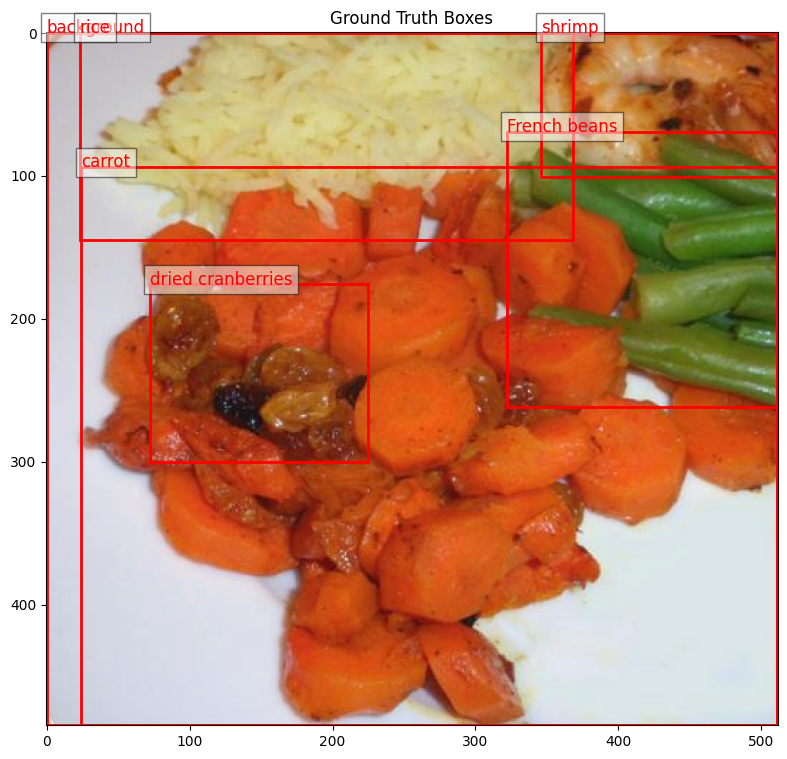

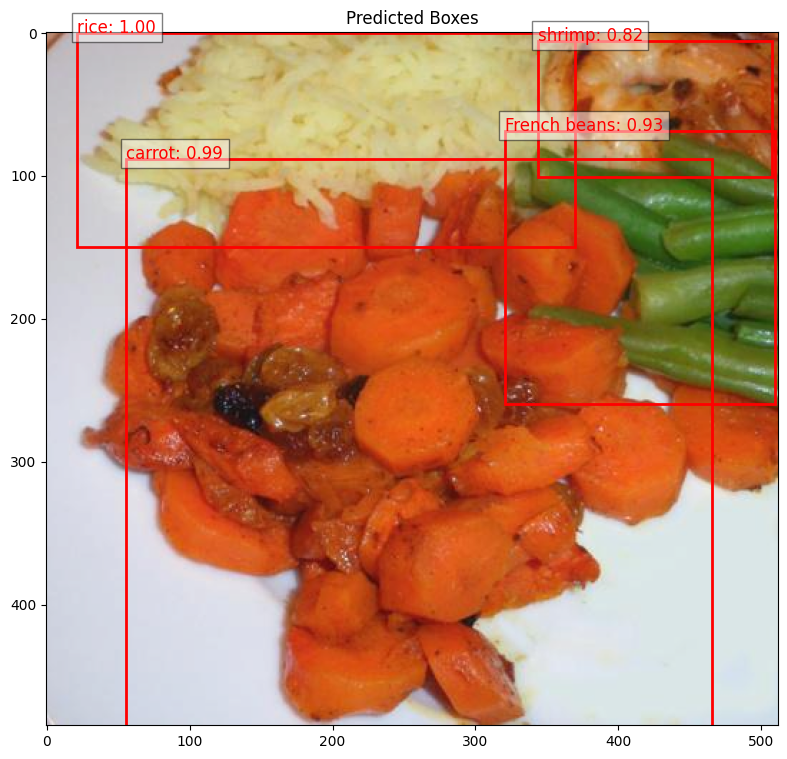

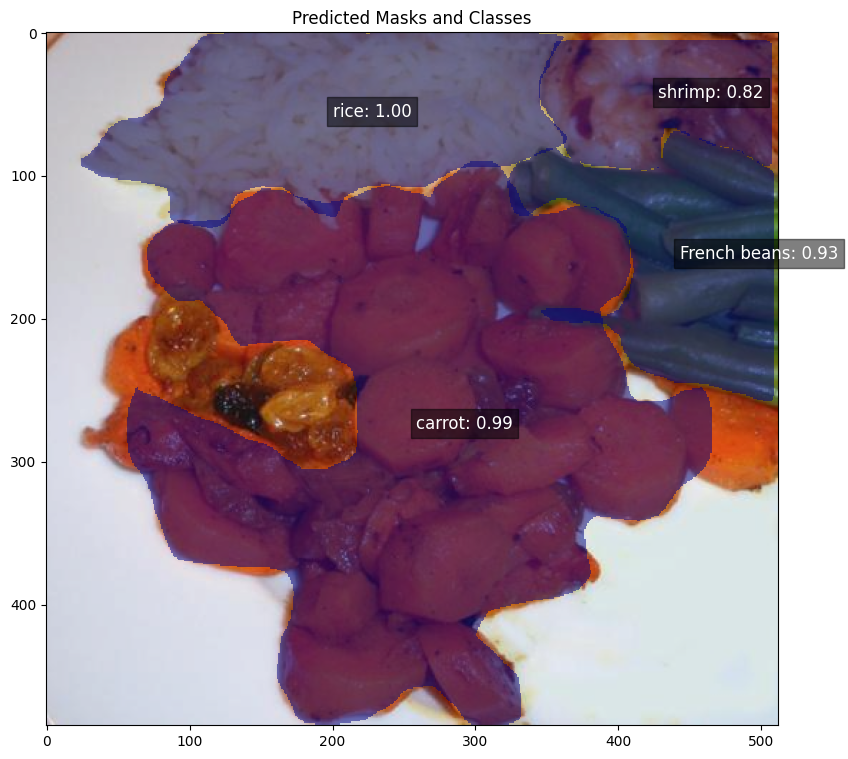

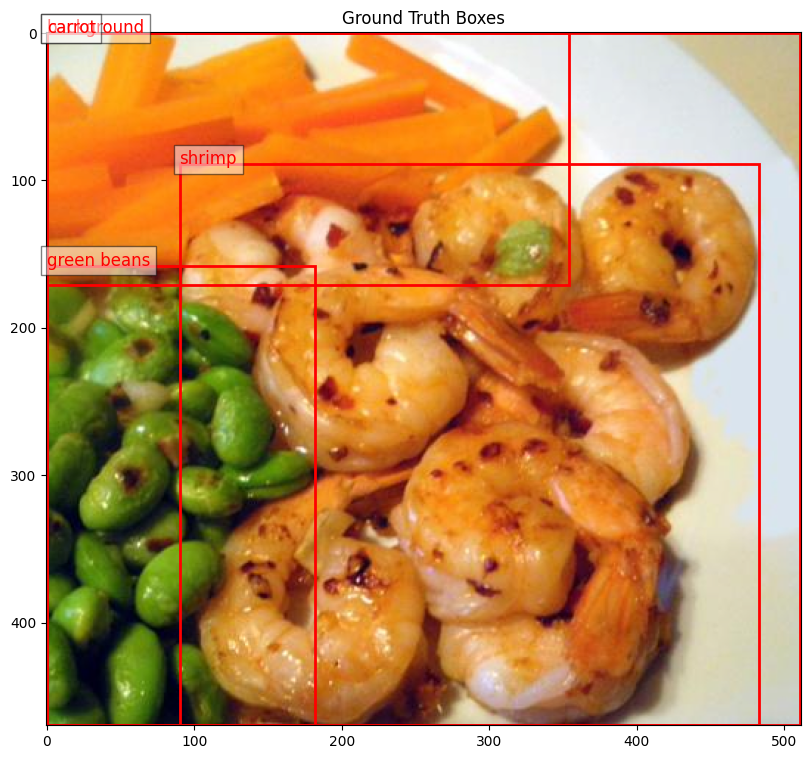

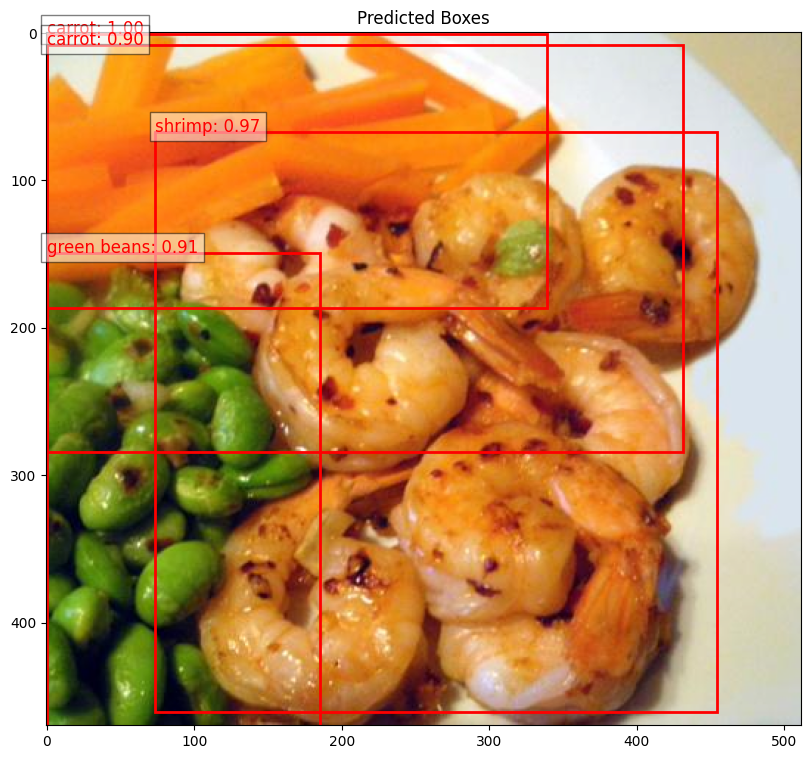

...

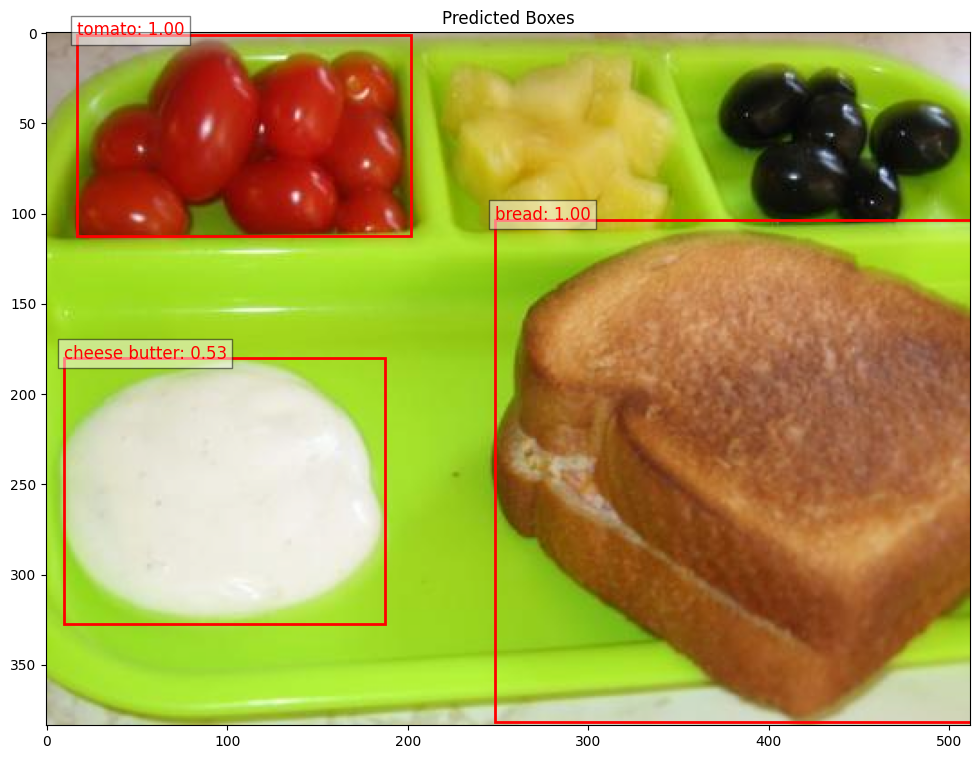

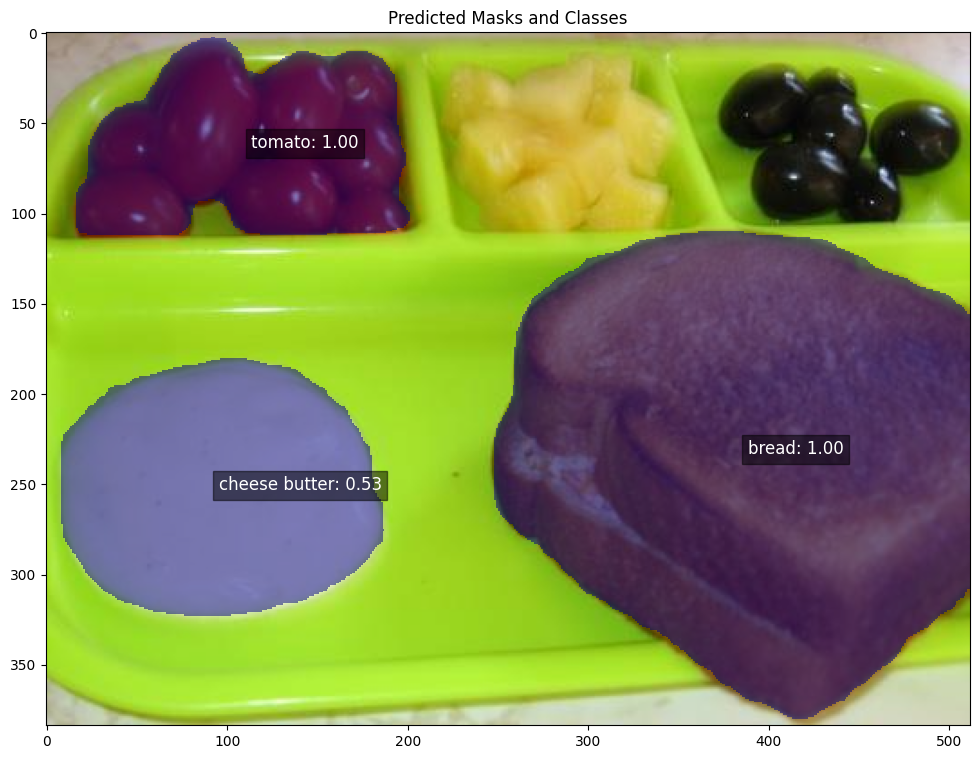

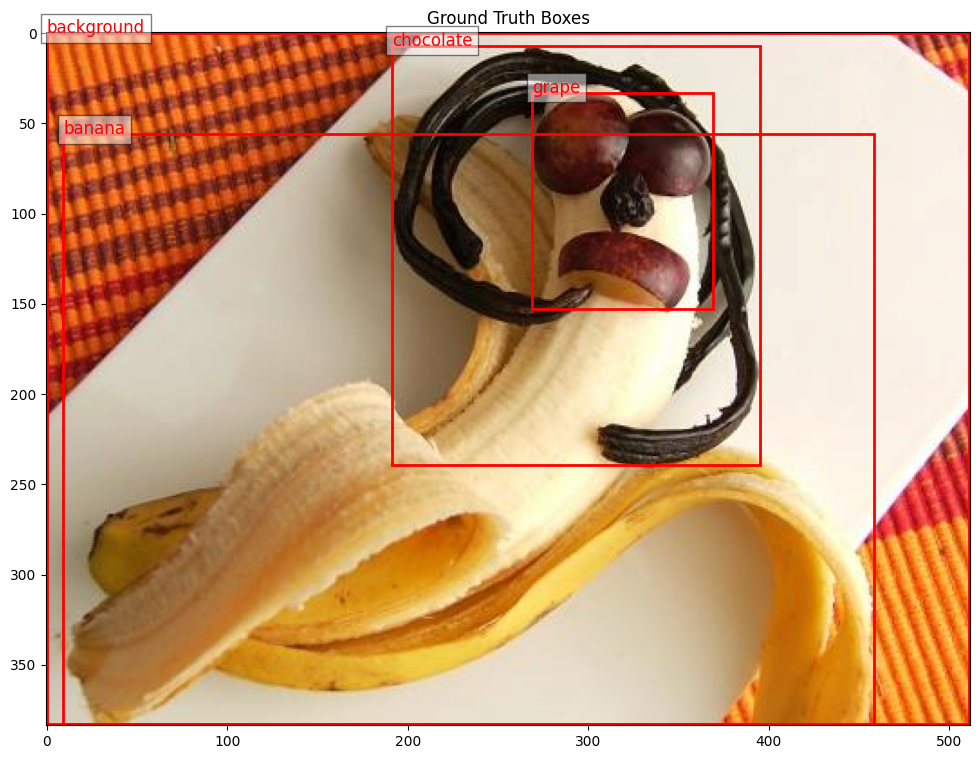

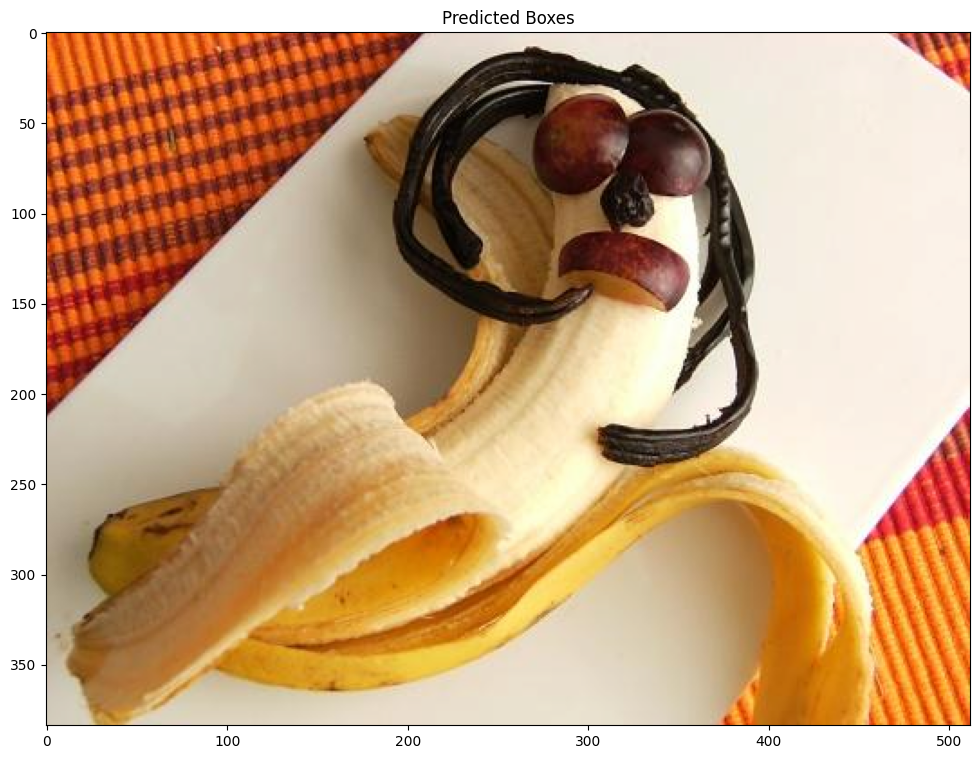

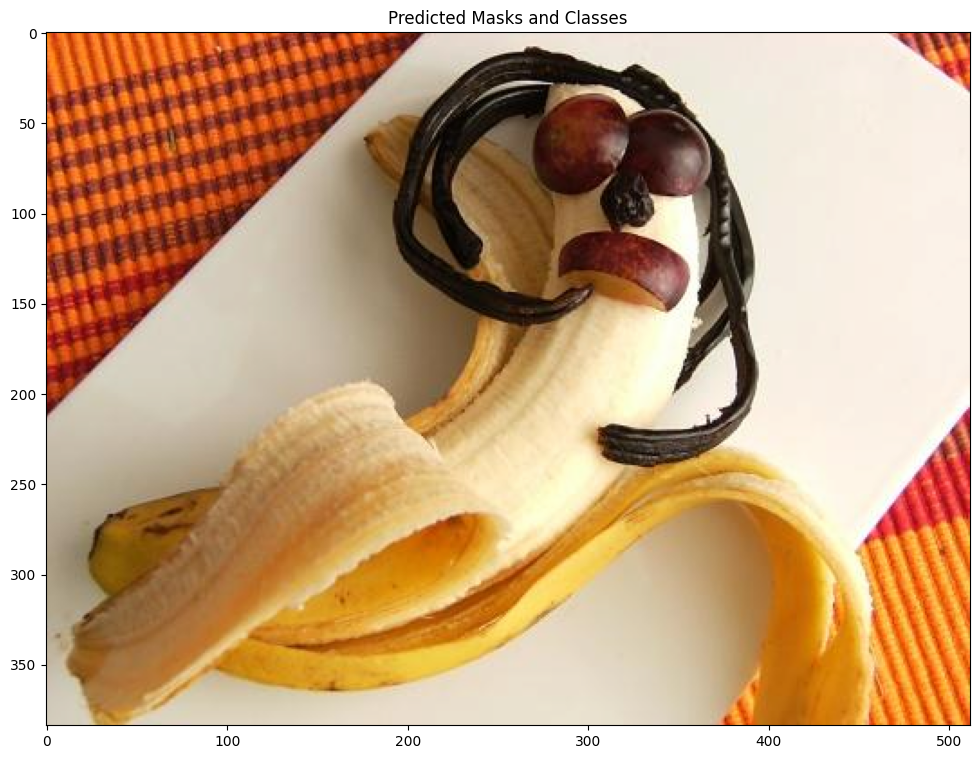

In [23]:

def visualize_image_with_boxes(image, boxes, labels, scores=None, score_threshold=0.5, title=""):
    """
    Visualizes the image with bounding boxes, filtering based on score threshold.
    
    Args:
        image: A torch tensor image.
        boxes: List or array of bounding boxes.
        labels: List of labels for the objects.
        scores: (Optional) List of confidence scores for each box.
        score_threshold: Score threshold for displaying boxes.
        title: Title for the plot.
    """
    # Convert tensor to numpy, and reverse the normalization
    image = image.cpu().permute(1, 2, 0).numpy()  # Convert from CHW to HWC
    mean = [0.485, 0.456, 0.406]  # ImageNet mean
    std = [0.229, 0.224, 0.225]  # ImageNet std
    image = denormalize_image(image, mean, std)

    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    # Convert scores to NumPy array if they are not already
    if scores is not None:
        scores = np.array(scores)
        boxes = np.array(boxes)   # Ensure boxes are numpy array
        labels = np.array(labels) # Ensure labels are numpy array

        # Filter by the score threshold
        keep = scores > score_threshold
        boxes = boxes[keep]
        labels = labels[keep]
        scores = scores[keep]

    # Add boxes and labels to the image
    for idx, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box
        # Use red color for the boxes
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Add class name and score to the top-left corner of the box with a transparent background
        class_name = class_names[labels[idx]]
        score = scores[idx] if scores is not None else None
        text = f"{class_name}: {score:.2f}" if score is not None else class_name
        ax.text(x_min, y_min, text, fontsize=12, color='red', bbox=dict(facecolor='white', alpha=0.5))

    plt.title(title)
    plt.show()


def visualize_image_with_boxes_pred(image, boxes, labels, scores=None, score_threshold=0.5, title=""):
    """
    Visualizes the image with bounding boxes and predicted masks.
    Filters based on score threshold.
    """
    # Convert tensor to numpy and transpose to HWC format for visualization
    image = image.cpu().permute(1, 2, 0).numpy()
    mean = [0.485, 0.456, 0.406]  # ImageNet mean
    std = [0.229, 0.224, 0.225]  # ImageNet std
    image = denormalize_image(image, mean, std)

    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    # Convert scores to NumPy array if they are not already
    if scores is not None:
        scores = np.array(scores)
        boxes = np.array(boxes)   # Ensure boxes are numpy array
        labels = np.array(labels) # Ensure labels are numpy array

        # Filter by the score threshold
        keep = scores > score_threshold
        boxes = boxes[keep]
        labels = labels[keep]
        scores = scores[keep]

    # Add boxes and masks to the image
    for idx, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box
        # Use red color for the boxes
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)


        # Add class name and score to the top-left corner of the box with a transparent background
        class_name = class_names[labels[idx]]
        score = scores[idx] if scores is not None else None
        text = f"{class_name}: {score:.2f}" if score is not None else class_name
        ax.text(x_min, y_min, text, fontsize=12, color='red', bbox=dict(facecolor='white', alpha=0.5))

    plt.title(title)
    plt.show()


def visualize_masks_with_classes(image, masks, labels, scores=None, score_threshold=0.5, title=""):
    """
    Visualizes the image with predicted masks and class labels.
    Filters based on score threshold.
    """
    # Convert tensor to numpy and transpose to HWC format for visualization
    image = image.cpu().permute(1, 2, 0).numpy()
    mean = [0.485, 0.456, 0.406]  # ImageNet mean
    std = [0.229, 0.224, 0.225]  # ImageNet std
    image = denormalize_image(image, mean, std)

    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    # Convert scores to NumPy array if they are not already
    if scores is not None:
        scores = np.array(scores)
        labels = np.array(labels) # Ensure labels are numpy array
        masks = np.array(masks)   # Ensure masks are numpy array

        # Filter by the score threshold
        keep = scores > score_threshold
        labels = labels[keep]
        scores = scores[keep]
        masks = masks[keep]

    # Add masks and class labels to the image
    for idx, mask in enumerate(masks):
        # Add the predicted mask overlay (resize to image size)
        mask = mask.squeeze()
        mask = mask > 0.5  # Binarize the mask (predicted masks are in [0, 1])
        mask = np.ma.masked_where(mask == 0, mask)  # Mask the zeros
        ax.imshow(mask, cmap='jet', alpha=0.5)  # Overlay the mask on the image

        # Add class name and score on top of the mask
        class_name = class_names[labels[idx]]
        score = scores[idx] if scores is not None else None
        text = f"{class_name}: {score:.2f}" if score is not None else class_name
        # Find the position to display the text (center of the mask)
        mask_center = np.mean(np.argwhere(mask), axis=0)
        ax.text(mask_center[1], mask_center[0], text, fontsize=12, color='white', bbox=dict(facecolor='black', alpha=0.5))

    plt.title(title)
    plt.show()


# Number of classes in your dataset (including background)
num_classes = 104  # Adjust this based on your dataset

# Load a pre-trained Mask R-CNN model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

# Replace the box predictor to match the number of classes
in_features_box = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features_box, num_classes)

# Replace the mask predictor to match the number of classes
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256  
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)

# Move the model to the device (GPU or CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Load the best model checkpoint
best_model_path = "/kaggle/input/mask-r-cnn-output/best_model.pth"
model.load_state_dict(torch.load(best_model_path))
model.eval()  # Set the model to evaluation mode

# DataLoader for the test set (ensure it's properly instantiated)
test_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# Test/Validation Loop
test_loss = 0.0

# Initialize a list to store the evaluation results
evaluation_results = []

# Define a confidence threshold
confidence_threshold = 0.5

# Test/Validation Loop
with torch.no_grad():  # No gradient calculation during inference
    for idx, (images, targets) in enumerate(test_loader):  # Add progress bar
        if idx >= 1:
            break
        images = [image.to(device) for image in images]
        
        # Forward pass (inference mode returns predictions, not loss)
        outputs = model(images)

        # Process the outputs and save the predictions
        for i, output in enumerate(outputs):
            pred_boxes = output['boxes'].cpu().numpy()
            pred_scores = output['scores'].cpu().numpy()
            pred_labels = output['labels'].cpu().numpy()
            pred_masks = output['masks'].cpu().numpy()
            image_id = targets[i]['image_id'].cpu().item()
            
            # Get ground truth data
            gt_boxes = targets[i]['boxes'].cpu().numpy().tolist()
            gt_labels = targets[i]['labels'].cpu().numpy().tolist()
            gt_masks = targets[i]['masks'].cpu().numpy()  # Ground truth masks in numpy

            # Also, visualize the ground truth boxes for comparison
            visualize_image_with_boxes(images[i], targets[i]['boxes'].cpu().numpy(), targets[i]['labels'].cpu().numpy(), title="Ground Truth Boxes")

            # Optionally visualize the predictions (image + predicted boxes)
            visualize_image_with_boxes_pred(images[i], pred_boxes, pred_labels, scores=pred_scores, score_threshold=confidence_threshold, title="Predicted Boxes")

            visualize_masks_with_classes(images[i], pred_masks, pred_labels, scores=pred_scores, score_threshold=confidence_threshold, title="Predicted Masks and Classes")
